In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
#Import Tree Models from scratch functions
import sys
import os

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path+"/TreeModelsFromScratch")

from DecisionTree import DecisionTree
from RandomForest import RandomForest
from SmoothShap import verify_shap_model, smooth_shap

In [60]:
# Import other libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
#import seaborn as sns
from imodels import HSTreeClassifier, HSTreeRegressor
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from copy import deepcopy
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
import shap
from shap.explainers._tree import SingleTree

In [4]:
# change working directory to imodels-experiment folder
if os.getcwd().split('/')[-1] == 'notebooks':
    os.chdir('../../imodels-experiments')
    
module_path_imodels = os.getcwd()
if module_path not in sys.path:
    sys.path.append(module_path_imodels+"/config/shrinkage")
    
from imodels.util.data_util import get_clean_dataset
from datasets import DATASETS_CLASSIFICATION, DATASETS_REGRESSION
from util import DATASET_PATH

#pd.options.display.max_rows = 100

# Recreation of results from hierarchical shrinkage paper

Hierarchical Shrinkage: Improving the accuracy and interpretability of tree-based models <br>
[Link to paper](https://proceedings.mlr.press/v162/agarwal22b.html)


>HS is integrated into the imodels package [imodels](github.com/csinva/imodels) (Singh et al., 2021) with an sklearn compatible API. Experiments for reproducing the results here can be found at [imodels-experiments](github.com/Yu-Group/imodels-experiments)

Unfortunately, not all experiments/ figures of the paper can be found in the aforementioned GitHub repository, therefore some of the charts will not be identical to the paper.

## SHAP plots (Fig. 7 and Appendix S5.2)

For the SHAP beeswarm plots there is no explanation on how they generated these plots.
We will use a forest with n_estimators=100 and lambda=100 with random state=1.

### Define function to create shap plot comparison

Since SHAP does not natively support imodel estimators we have to export them first

In [88]:
def export_imodels_for_SHAP(imodel, is_forest=True):
    '''Exports imodel estimator in a shap readable format'''
    if is_forest:
        
        tree_dicts=[]
        
        for tree in imodel.estimator_.estimators_:

            # extract the arrays that define the tree
            children_left = tree.tree_.children_left
            children_right = tree.tree_.children_right
            children_default = children_right.copy() # because sklearn does not use missing values
            features = tree.tree_.feature
            thresholds = tree.tree_.threshold
            if str(type(imodel))[-12:-2]=="Classifier":
                values = tree.tree_.value[:,:,1]
            else:
                values = tree.tree_.value.reshape(tree.tree_.value.shape[0], 1)
            node_sample_weight = tree.tree_.weighted_n_node_samples
            
            # define a custom tree model
            tree_dict = {
                "children_left": children_left,
                "children_right": children_right,
                "children_default": children_default,
                "features": features,
                "thresholds": thresholds,
                "values": values,
                "node_sample_weight": node_sample_weight
            }
            
            tree_dicts.append(tree_dict)
        
        if str(type(imodel))[-12:-2]=="Classifier":
            model = [SingleTree(t, scaling=1.0 / len(tree_dicts), normalize=True) for t in tree_dicts]
        else:
            model = [SingleTree(t, scaling=1.0 / len(tree_dicts)) for t in tree_dicts]
    
        return model
    
    # If single Tree model
    
    # extract the arrays that define the tree
    children_left = imodel.estimator_.tree_.children_left
    children_right = imodel.estimator_.tree_.children_right
    children_default = children_right.copy() # because sklearn does not use missing values
    features = imodel.estimator_.tree_.feature
    thresholds = imodel.estimator_.tree_.threshold

    if str(type(imodel))[-12:-2]=="Classifier":
        values = imodel.estimator_.tree_.value[:,:,1]
    else:
        values = imodel.estimator_.tree_.value.reshape(imodel.estimator_.tree_.value.shape[0], 1)
    node_sample_weight = imodel.estimator_.tree_.weighted_n_node_samples

    # define a custom tree model
    tree_dict = {
        "children_left": children_left,
        "children_right": children_right,
        "children_default": children_default,
        "features": features,
        "thresholds": thresholds,
        "values": values,
        "node_sample_weight": node_sample_weight
    }
    model = {"trees": [tree_dict]}
    
    return model

In [104]:
def create_shap_summary_comparison(index_dataset, n_estimators=50, reg_param=100, random_state=42, subset=1.0):
    
    #Load dataset
    dset_name, dset_file, data_source = DATASETS_CLASSIFICATION[index_dataset]
    X_train, y_train, feat_names = get_clean_dataset(dset_file, data_source, DATASET_PATH)
    X_train, X_test, y_train, y_test = train_test_split(X_train,y_train, train_size=subset, random_state=random_state)
    
    #fit sklearn
    rf_sk = RandomForestClassifier(n_estimators=n_estimators, random_state=random_state)
    rf_sk.fit(X_train, y_train)
    #y_pred_sk = rf_sk.predict(X_test[:,most_imp_feats])
    explainer_sk = shap.TreeExplainer(rf_sk)
    shap_values_sk = explainer_sk.shap_values(X_train)
    
    #fit imodels
    rf_im = HSTreeClassifier(deepcopy(rf_sk), reg_param=reg_param)
    #y_pred_shrunk = rf_im.predict(X_test[:,most_imp_feats])
    export_im = export_imodels_for_SHAP(rf_im)
    explainer_im = shap.TreeExplainer(export_im)
    shap_values_im = explainer_im.shap_values(X_train)

    #Fit scratch without HS
    rf_scr = RandomForest(n_trees=n_estimators, treetype='classification', 
                          n_feature=int(np.rint(np.sqrt(X.shape[1]))), random_state=random_state)
    rf_scr.fit(X_train, y_train)
    #y_pred_scratch = rf_scr.predict(X_test[:,most_imp_feats])
    export_model = rf_scr.export_forest_for_SHAP()
    explainer_scr = shap.TreeExplainer(export_model)
    shap_values_scr = explainer_scr.shap_values(X_train)

    #HS scratch
    rf_scr_HS = RandomForest(n_trees=n_estimators, treetype='classification', 
                             n_feature=int(np.rint(np.sqrt(X.shape[1]))), HShrinkage=True, 
                             HS_lambda=reg_param, random_state=random_state)
    rf_scr_HS.fit(X_train, y_train)
    #y_pred_scratch_HS = rf_scr_HS.predict(X_test[:,most_imp_feats]) 
    export_model_HS = rf_scr_HS.export_forest_for_SHAP()
    explainer_scr_HS = shap.TreeExplainer(export_model_HS)
    shap_values_scr_HS = explainer_scr_HS.shap_values(X_train)
    
    #Create plot
    fig = plt.figure()
    
    #sklearn
    ax0 = fig.add_subplot(221)
    ax0.set_title("RF")
    shap.summary_plot(shap_values_sk[1], X_train, feature_names=feat_names, max_display=10, show=False)
    
    #imodles
    ax1 = fig.add_subplot(222)
    ax1.set_title("hsRF")
    shap.summary_plot(shap_values_im, X_train, feature_names=feat_names, max_display=10, show=False)
    
    #scratch RF
    ax2 = fig.add_subplot(223)
    ax2.set_title("RF scratch")
    shap.summary_plot(shap_values_scr, X_train, feature_names=feat_names, max_display=10, show=False)
    
    #scratch hsRF
    ax3 = fig.add_subplot(224)
    ax3.set_title("hsRF scratch")
    shap.summary_plot(shap_values_scr_HS, X_train, feature_names=feat_names, max_display=10, show=False)
    
    plt.gcf().set_size_inches(20,10)
    plt.suptitle(f"Dataset: {dset_name}", fontsize=14)
    plt.tight_layout() 
    plt.show()


<div class="alert alert-warning">
<b>Attention!</b> Re-running the cells below may take a while (2-8 minutes per plot).
</div>

### Heart dataset (Figure S11 in Appendix)

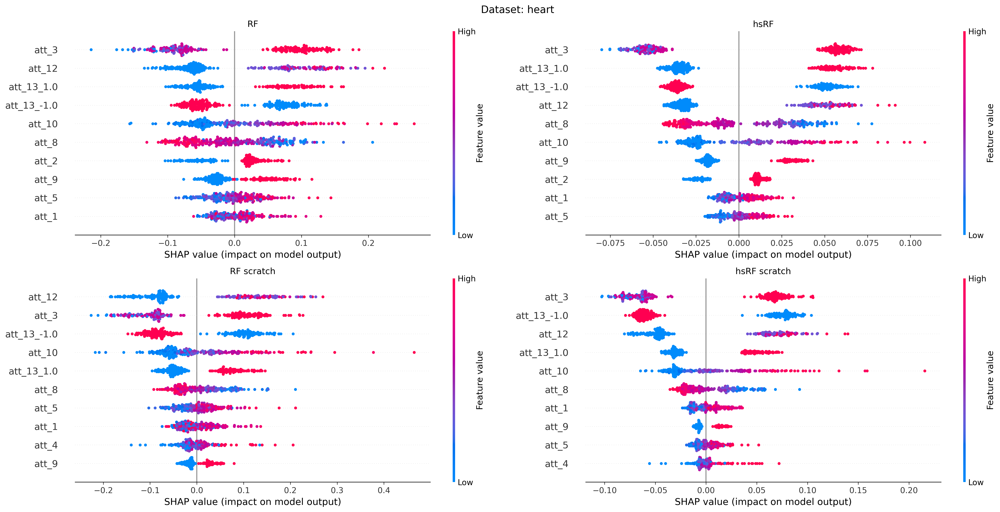

In [90]:
create_shap_summary_comparison(1)

- The order of features (importance) differs between all plots!
- Shap values and distribution for self-developed models are very similar to the ones from sklearn and imodels

### Breast cancer dataset (Figure S11 in Appendix)

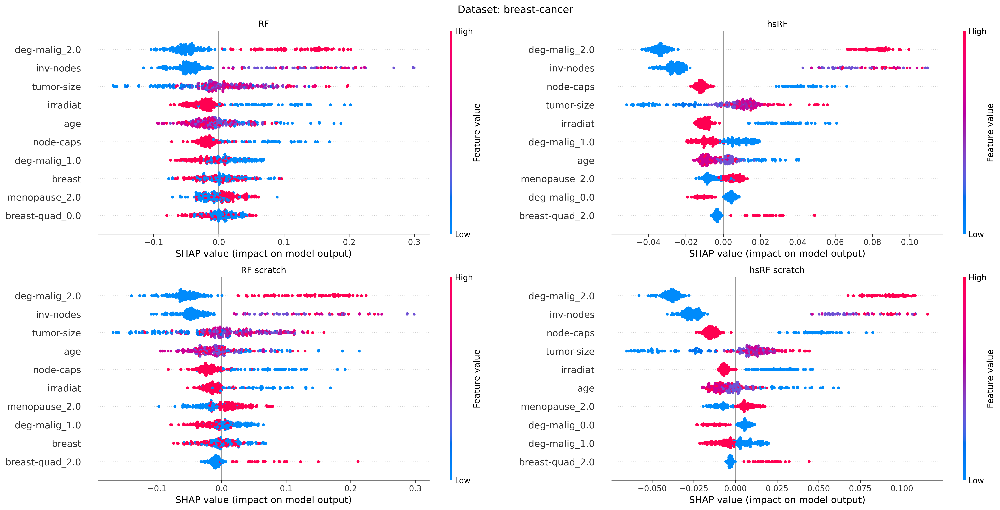

In [91]:
create_shap_summary_comparison(2)

- The order of features (importance) differs between all plots!
- Shap values and distribution for self-developed models are very similar to the ones from sklearn and imodels

### Haberman dataset (Figure S11 in Appendix)

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


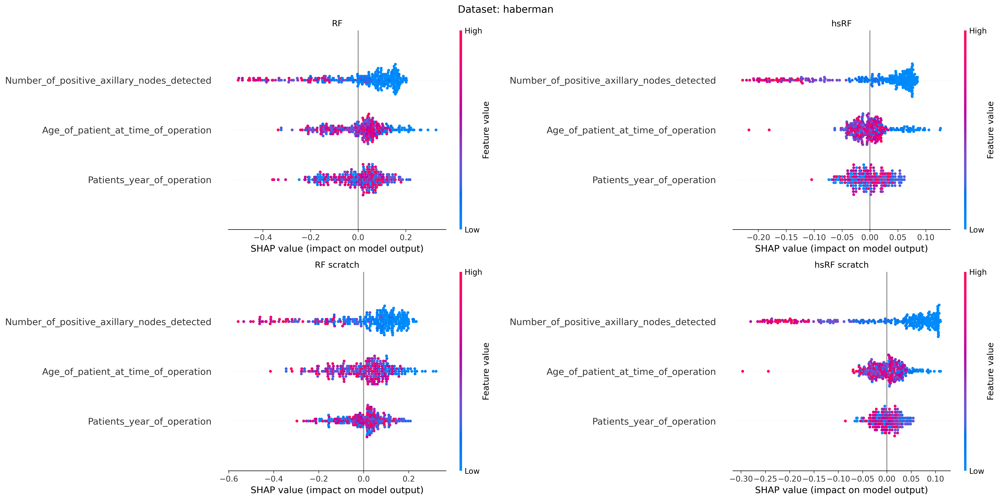

In [92]:
create_shap_summary_comparison(3)

- For this dataset the feature order (importance) is identical to the paper
- Original plots in paper shows more clustered data for HS, this may be due to a higher lambda
- Shap values and distribution for self-developed models are very similar to the ones from sklearn and imodels

### Ionosphere dataset (Figure S11 in Appendix)

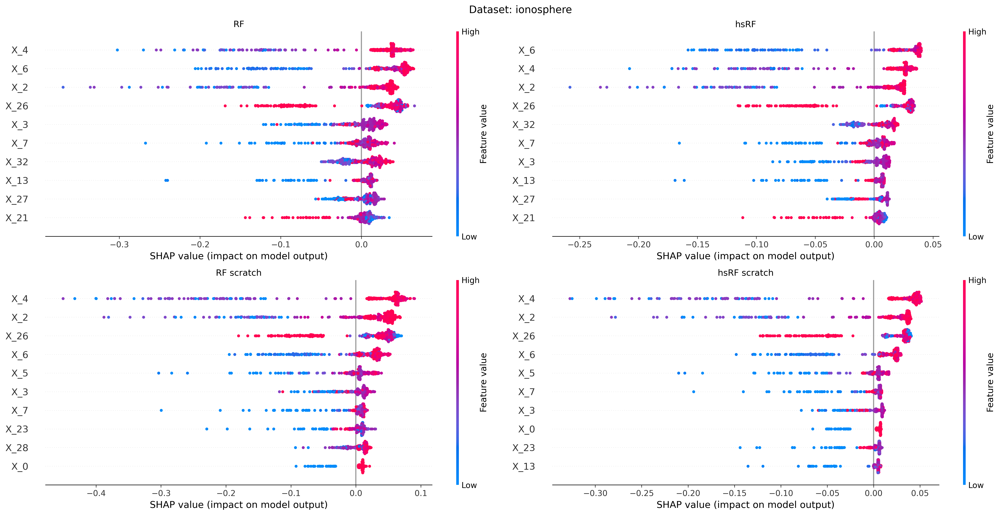

In [93]:
create_shap_summary_comparison(4)

- The order of features (importance) differs between all plots
- Shap values and distribution for self-developed models are very similar to the ones from sklearn and imodels

### Diabetes dataset (Figure S12 in Appendix)

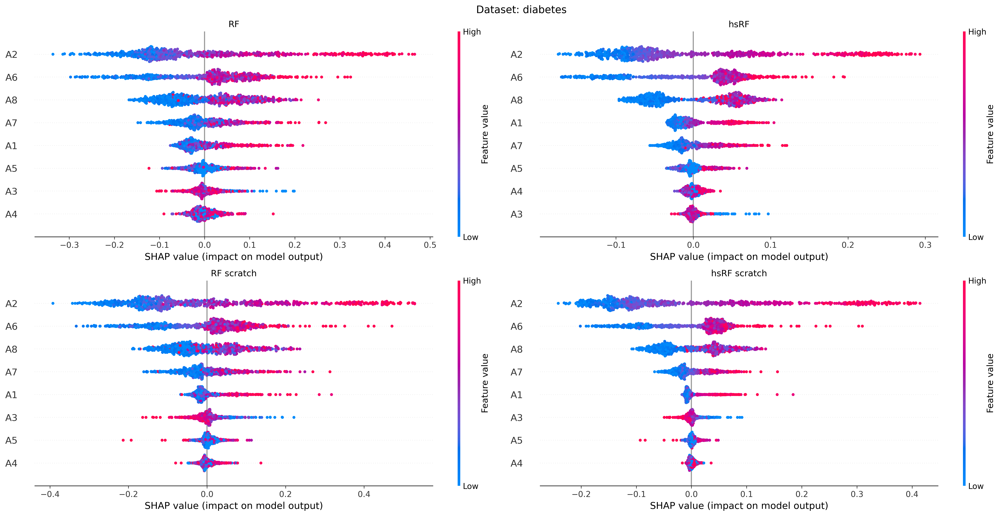

In [94]:
create_shap_summary_comparison(5)

- The order of features (importance) differs slightly
- Shap values and distribution for self-developed models are very similar to the ones from sklearn and imodels

### German credit dataset (Figure S12 in Appendix)

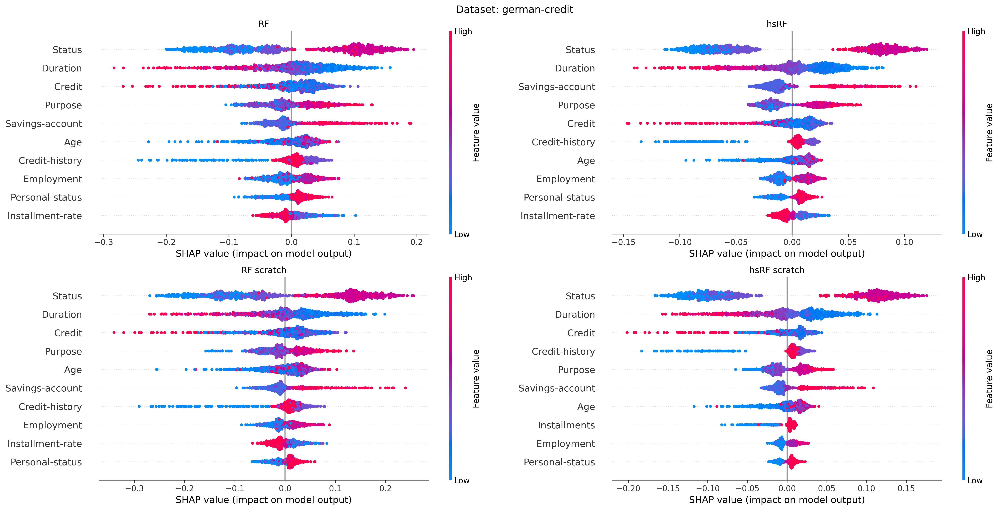

In [95]:
create_shap_summary_comparison(6)

- The order of features (importance) differs slightly between all plots
- Shap values and distribution for self-developed models are very similar to the ones from sklearn and imodels

### Juvenile dataset (Figure S12 in Appendix)

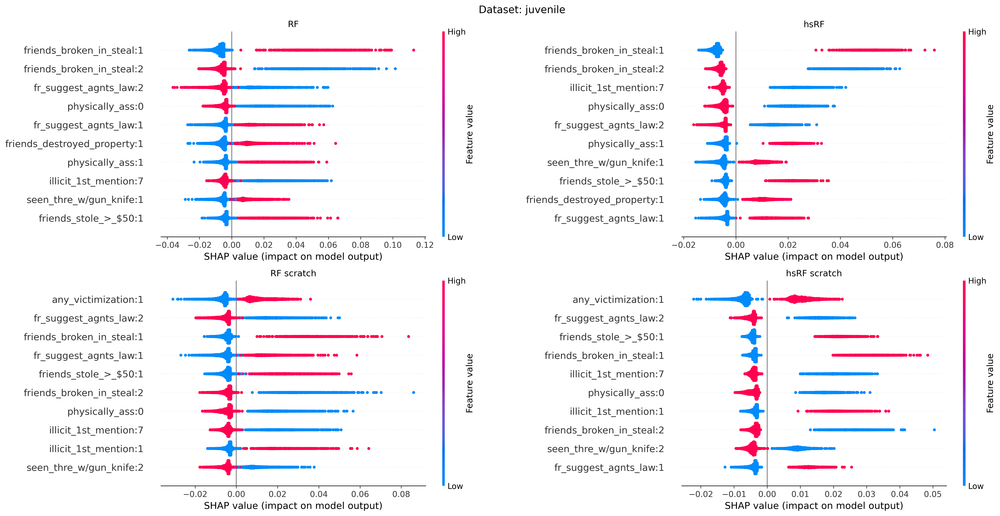

In [96]:
create_shap_summary_comparison(7)

- The order of features (importance) differs between all plots
- Harder to compare, since majority of top 10 features of sklearn differs from scratch model
- Clustering for HS models in both plots visible

### Recidivism dataset (Figure S12 in Appendix)

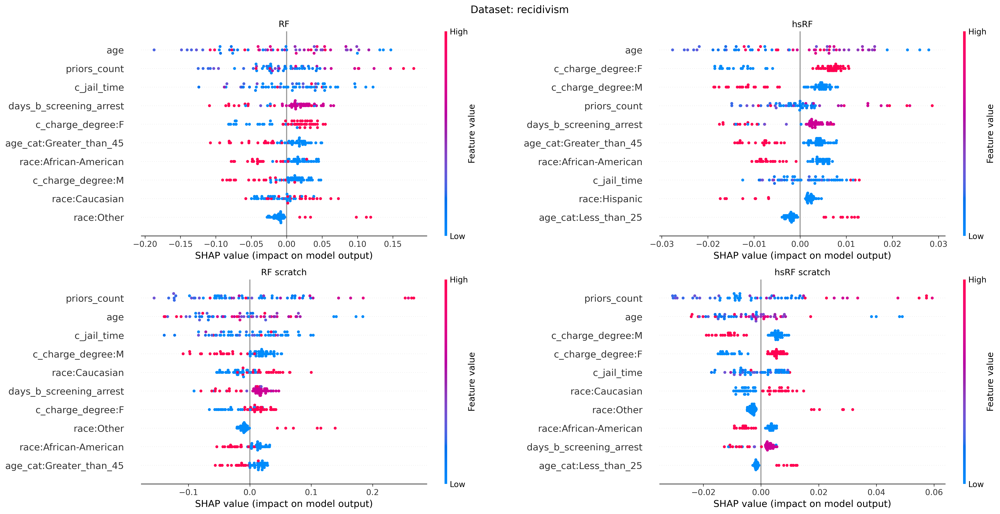

In [106]:
# Since this dataset is fairly big, we reduced the number of datapoints 
create_shap_summary_comparison(8, subset=0.01)

- Since this dataset is fairly big, we reduced the number of datapoints -> comparison more difficult


## Stability of SHAP Values to Data Resampling

> In this experiment, for each dataset, we randomly choose 50 samples to hold out, and for each of 100 iterations, we
randomly select two thirds of the remaining samples and train an RF on the reduced dataset. For each held-out sample, we measure the variance of its SHAP values per feature across the 100 iterations. We then average the variance per feature across all 50 held-out samples, with these values plotted in Fig S13 and Fig S14 for RF with HS and without. We observe that the variances of the SHAP values for RF with HS are substantially smaller than those for RF without HS.

### Define functions to recreate plots

In [127]:
def create_shap_stability_comparison(index_dataset, return_scratch=False, n_estimators=50, reg_param=100, n_iter=100, holdout_size=50, random_state=42, verbose=0):
    
    # Load dataset
    dset_name, dset_file, data_source = DATASETS_CLASSIFICATION[index_dataset]
    X, y, feat_names = get_clean_dataset(dset_file, data_source, DATASET_PATH)
    
    #Hold out 50 samples
    X_train, X_holdout, y_train, y_holdout = train_test_split(X, y, test_size=holdout_size, random_state=random_state)
    
    #Empty array to store shap values
    shap_vals_array_sk = np.empty((n_iter, holdout_size, X_holdout.shape[1]))
    shap_vals_array_im = np.empty((n_iter, holdout_size, X_holdout.shape[1]))
    
    if return_scratch:
        shap_vals_array_scr = np.empty((n_iter, holdout_size, X_holdout.shape[1]))
        shap_vals_array_scr_HS = np.empty((n_iter, holdout_size, X_holdout.shape[1]))
    
    for i in range(n_iter):
        
        #print every 10th iterration to see progress
        if (verbose==1)&(i%10==0):
            print(i)
        
        #Randomly choose 2/3 for training 
        X_train_small, X_test_small, y_train_small, y_test_small = train_test_split(X_train, y_train, 
                                                                                    test_size=(1/3), random_state=random_state)
        
        # sklearn 
        rf_sk = RandomForestClassifier(n_estimators=n_estimators, random_state=random_state)
        rf_sk.fit(X_train_small, y_train_small)
        explainer_sk = shap.TreeExplainer(rf_sk)
        shap_vals_array_sk[i,:,:] = explainer_sk.shap_values(X_holdout)[1] #only store preds of class 1
        
        # imodels
        rf_im = HSTreeClassifier(deepcopy(rf_sk), reg_param=reg_param)
        export_im = export_imodels_for_SHAP(rf_im)
        explainer_im = shap.TreeExplainer(export_im)
        shap_vals_array_im[i,:,:] = explainer_im.shap_values(X_holdout)
        
        if return_scratch:

            # scratch without HS
            rf_scr = RandomForest(n_trees=n_estimators, treetype='classification', 
                                  n_feature=int(np.rint(np.sqrt(X.shape[1]))), random_state=random_state)
            rf_scr.fit(X_train_small, y_train_small)
            export_model = rf_scr.export_forest_for_SHAP()
            explainer_scr = shap.TreeExplainer(export_model)
            shap_vals_array_scr[i,:,:] = explainer_scr.shap_values(X_holdout)

            # HS scratch
            rf_scr_HS = RandomForest(n_trees=n_estimators, treetype='classification', 
                                     n_feature=int(np.rint(np.sqrt(X.shape[1]))), HShrinkage=True, 
                                     HS_lambda=reg_param, random_state=random_state)
            rf_scr_HS.fit(X_train_small, y_train_small)
            export_model_HS = rf_scr_HS.export_forest_for_SHAP()
            explainer_scr_HS = shap.TreeExplainer(export_model_HS)
            shap_vals_array_scr_HS[i,:,:] = explainer_scr_HS.shap_values(X_holdout)
    
        
    if return_scratch:
        shap_vals_array_sk, shap_vals_array_im, feat_names
    
    return shap_vals_array_sk, shap_vals_array_im, shap_vals_array_scr, shap_vals_array_scr_HS, feat_names


<div class="alert alert-warning">
<b>Attention!</b> Re-running the cells with return_scratch=True takes very long, since no parallel processing is implemented.
</div>

### Heart dataset

In [128]:
#%%time
#shap_vals_array_sk, shap_vals_array_im, shap_vals_array_scr, shap_vals_array_scr_HS, feat_names = create_shap_stability_comparison(1, return_scratch=True)

CPU times: user 16min 23s, sys: 5.5 s, total: 16min 29s
Wall time: 16min 56s


> For each held-out sample, we measure the variance of its SHAP values per feature across the 100 iterations. We then average the variance per feature across all 50 held-out samples, with these values plotted in Fig S13 and Fig S14 for RF with HS and without. We observe that the variances of the SHAP values for RF with HS are substantially smaller than those for RF without HS.

In [140]:
# Calculate avg of var p. feature
shap_avg_var_sk = shap_vals_array_sk.var(axis=0).mean(axis=0)
shap_avg_var_im = shap_vals_array_im.var(axis=0).mean(axis=0)
shap_avg_var_scr = shap_vals_array_scr.var(axis=0).mean(axis=0)
shap_avg_var_scr_HS = shap_vals_array_scr_HS.var(axis=0).mean(axis=0)

In [150]:
# features which are shown in the paper
feat_names_plot= ["att_10", "att_3", "att_13_1.0", "att_12", "att_13_-1.0", "att_8", "att_1", "att_9", "att_5", "att_2"]

In [152]:
# list of values which should be plotted
feat_order = [feat_names.index(feat) for feat in feat_names_plot]

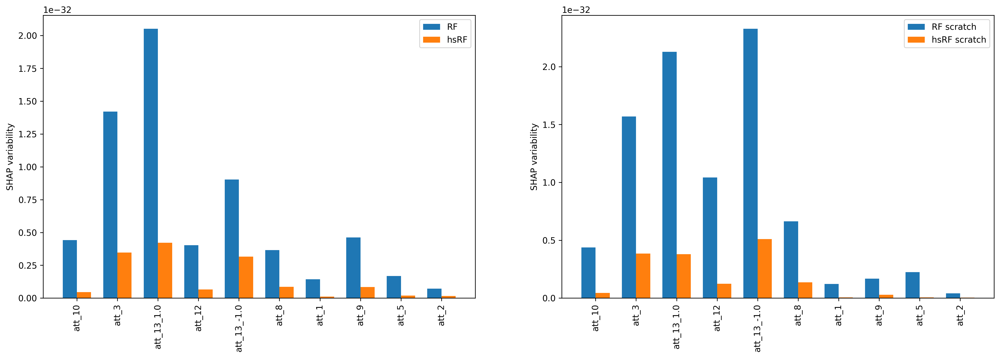

In [204]:
# Create plot
x = np.arange(len(feat_names_plot))  # the label locations
width = 0.35  # the width of the bars

fig, axs = plt.subplots(1,2,figsize=(20,6))

# Original (sklearn & HS)
bar_sk = axs[0].bar(x - width/2, [shap_avg_var_sk[i] for i in feat_order], width, label='RF')
bar_im = axs[0].bar(x + width/2, [shap_avg_var_im[i] for i in feat_order], width, label='hsRF')
axs[0].set_ylabel('SHAP variability')
axs[0].set_xticks(x, feat_names_plot, rotation=90)
axs[0].legend()

# Scratch 
bar_scr = axs[1].bar(x - width/2, [shap_avg_var_scr[i] for i in feat_order], width, label='RF scratch')
bar_scr_HS = axs[1].bar(x + width/2, [shap_avg_var_scr_HS[i] for i in feat_order], width, label='hsRF scratch')
axs[1].set_ylabel('SHAP variability')
axs[1].set_xticks(x, feat_names_plot, rotation=90)
axs[1].legend()

#fig.tight_layout()

plt.show()

Plots look similar to original paper, **BUT** the order of magnitude of SHAP variability (with and without HS) is considerably different?!